In [5]:
import xarray as xr
import matplotlib.pyplot as plt
from cmocean import cm 
import numpy as np
import pandas as pd
from tqdm import tqdm

In [6]:
ds = xr.open_dataset(r'../data/amazon2.nc')

$$
w_{\text{mean}}(z) = \frac{ \sum_{k=0}^{z} \left( -\nabla_h \cdot \vec{u}(k) \cdot \Delta z_k \right) }{ \sum_{k=0}^{z} \Delta z_k }
$$


In [37]:
A = 6371.0e3  # radio terrestre en metros

# Selecciona los campos de velocidad
u = ds.uo.isel(time=0)
v = ds.vo.isel(time=0)

# --------------------------
# 1. CÁLCULO DE DX, DY, DZ
# --------------------------

dy = np.deg2rad(ds.latitude.shift(latitude=-1) - ds.latitude) * A
dx = (
    np.deg2rad(ds.longitude.shift(longitude=-1) - ds.longitude)
    * A * np.cos(np.deg2rad(ds.latitude))
)

# z_mid y dz entre niveles
z_mid = (ds.depth.shift(depth=-1) + ds.depth) / 2
z_mid = z_mid.isel(depth=slice(0, -1))  # 49 niveles, sin NaN
dz = ds.depth.diff('depth')             # también 49 niveles

# --------------------------
# 2. INTERPOLACIÓN A CENTRO DE CELDA
# --------------------------

# dudx al centro horizontal
dudx = (u.shift(longitude=-1) - u) / dx
dudx = (dudx.shift(latitude=-1) + dudx) / 2.0

# dvdy al centro horizontal
dvdy = (v.shift(latitude=-1) - v) / dy
dvdy = (dvdy.shift(longitude=-1) + dvdy) / 2.0

# lat/lon en el centro
lon_c = (ds.longitude.shift(longitude=-1) + ds.longitude) / 2
lat_c = (ds.latitude.shift(latitude=-1) + ds.latitude) / 2

# Ajustar coordenadas y recortar bordes (porque hicimos shift)
dudx = dudx.assign_coords(longitude=lon_c, latitude=lat_c).isel(longitude=slice(None, -1), latitude=slice(None, -1))
dvdy = dvdy.assign_coords(longitude=lon_c, latitude=lat_c).isel(longitude=slice(None, -1), latitude=slice(None, -1))

# --------------------------
# 3. DIVERGENCIA HORIZONTAL
# --------------------------

div_h = dudx + dvdy
div_h = div_h.transpose("depth", "latitude", "longitude")  # asegurar orden

# --------------------------
# 4A. MÉTODO 1: PERFIL ACUMULADO DE W DESDE SUPERFICIE
# --------------------------

# Broadcast dz para que tenga shape compatible con div_h
dz_3d = dz.broadcast_like(div_h.isel(depth=slice(0, -1)))

# integrando desde superficie
integrand = -div_h.isel(depth=slice(0, -1)) * dz_3d
w_accum = integrand.cumsum("depth", skipna=True)
w_accum = w_accum.assign_coords(depth=z_mid)
w_accum.name = "w_accum"

# --------------------------
# 5. COMPENSATE THE W 
# --------------------------

# Paso 2: Cumsum del numerador y denominador
numerator = integrand.cumsum(dim="depth", skipna=True)
denominator = dz_3d.cumsum(dim="depth", skipna=True)

# Paso 3: División segura
w_mean = (numerator / denominator).where((numerator != 0) & (denominator != 0))
w_approx = w_mean * z_mid

# Paso 4: Ajustar coordenadas
w_mean = w_mean.assign_coords(depth=z_mid)
w_mean.name = "w_mean"

w_mean.attrs["units"] = "m/s"
w_mean.attrs["long_name"] = "normalized accumulated Vertical velocity"

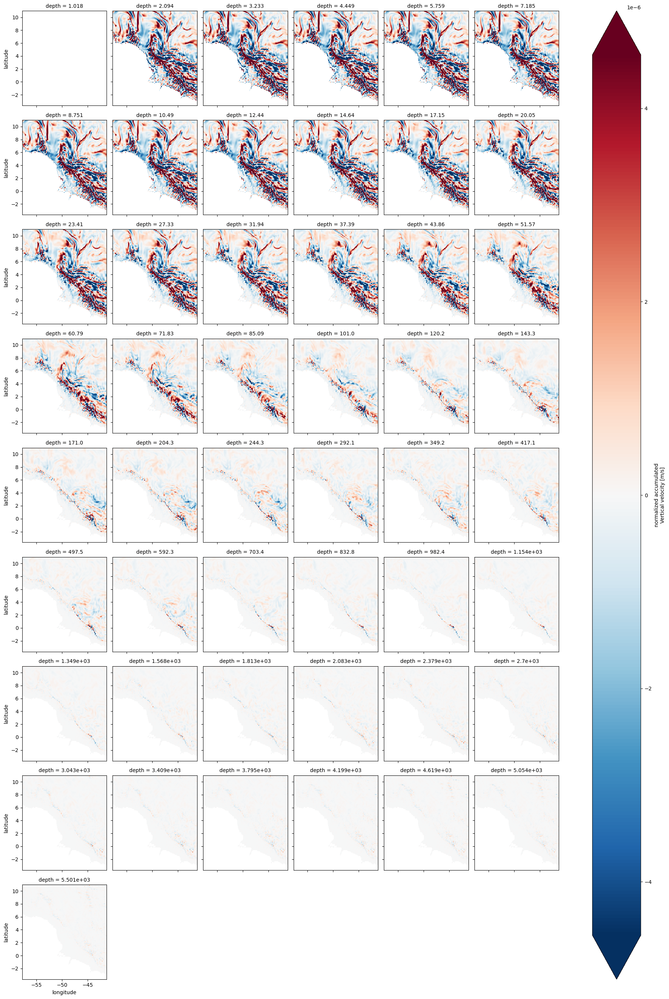

In [32]:
w_mean.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

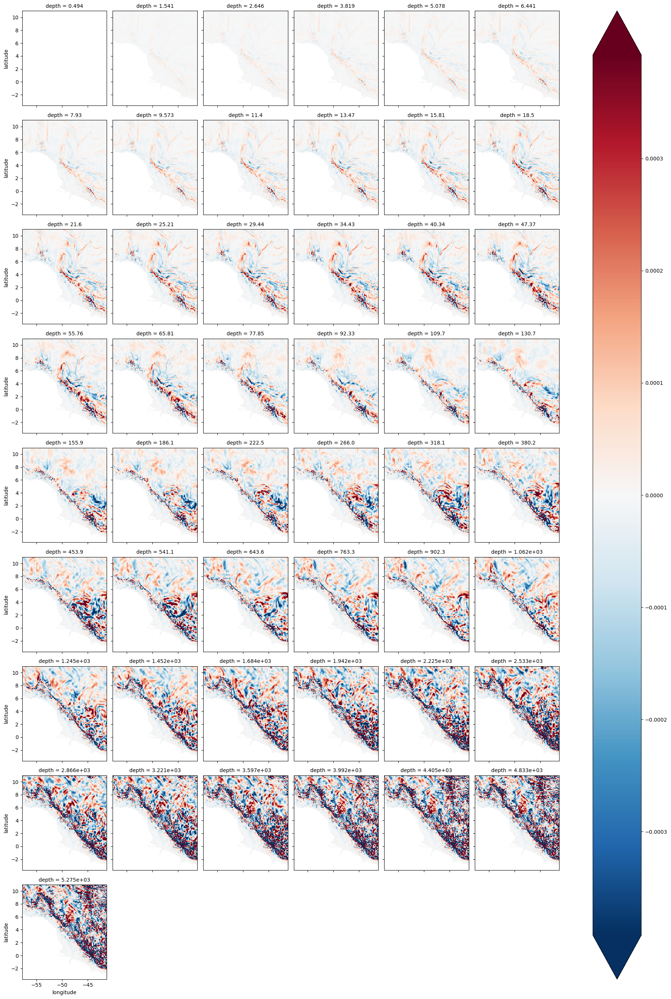

In [38]:
w_approx.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

## Integration from the bottom up of W

In [19]:
# Cortamos la última profundidad (div_h tiene 50, dz tiene 49)
div_cut = div_h.isel(depth=slice(0, -1))

# Invertimos profundidad para integrar hacia arriba
div_inv = div_cut[::-1]
dz_inv = dz[::-1].broadcast_like(div_inv)

# Calculamos integrando hacia la superficie (bottom-up)
integrand_inv = div_inv * dz_inv  # sin el signo negativo
w_bottom_up = integrand_inv.cumsum("depth", skipna=True)

# Volvemos al orden original
w_bottom_up = w_bottom_up[::-1]

# Asignamos coordenadas de z_mid y nombre
w_bottom_up = w_bottom_up.assign_coords(depth=z_mid)
w_bottom_up.name = "w_bottom_up"

In [22]:
w_bottom_up = w_bottom_up.where(w_bottom_up != 0)

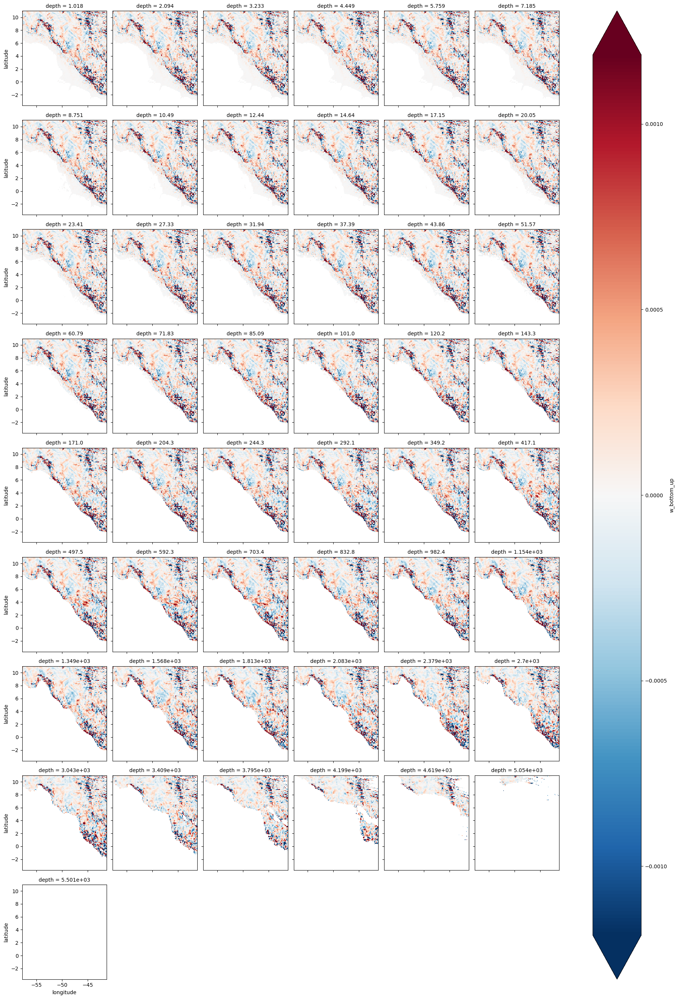

In [23]:
w_bottom_up.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

## Integration from Bottom Up W version 2

In [25]:
# 1. Preparar z_mid y dz
z_mid = (ds.depth.shift(depth=-1) + ds.depth) / 2
z_mid = z_mid.isel(depth=slice(0, -1))     # tamaño (nz - 1)
dz = ds.depth.diff('depth')                # tamaño (nz - 1)

# 2. Interpolar div_h a los niveles medios
div_h_mid = 0.5 * (div_h.isel(depth=slice(0, -1)) + div_h.isel(depth=slice(1, None)))
# div_h_mid = div_h_mid.assign_coords(depth=z_mid)

In [27]:
# 3. Broadcast de dz
dz_3d = dz.broadcast_like(div_h_mid)

# 4. Integrando desde el fondo hacia la superficie
integrand = -div_h_mid * dz_3d

# Invertir profundidad para integrar de abajo hacia arriba
integrand_rev = integrand.sortby("depth", ascending=False)

# Integración tipo cumsum desde el fondo
w_bottom_up = integrand_rev.cumsum("depth", skipna=True)

# Volver al orden original de profundidad
w_bottom_up = w_bottom_up.sortby("depth")

# Asignar nombre y coordenadas
w_bottom_up.name = "w_bottom_up"
w_bottom_up = w_bottom_up.where(w_bottom_up != 0)

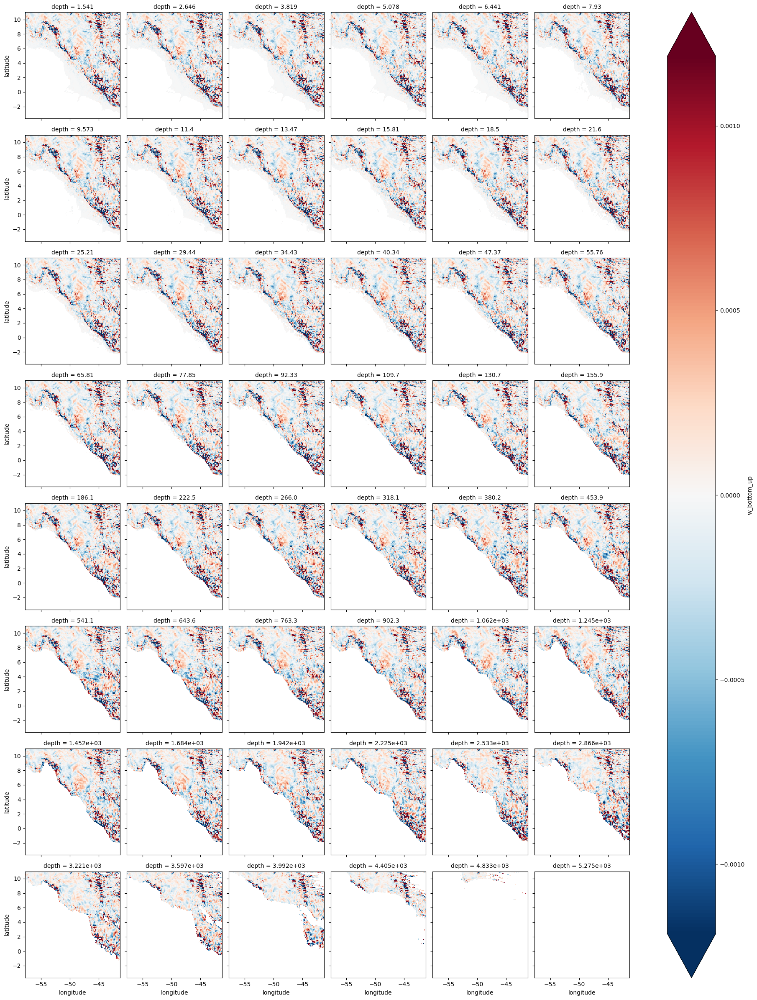

In [28]:
w_bottom_up.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

## Discretization of W version 3

In [29]:
# Supongamos que div_h tiene dimensiones (depth, lat, lon)
# Asegúrate que la coordenada "depth" esté ordenada de menor a mayor profundidad

z = ds.depth  # (depth,)
div_k = div_h
div_km1 = div_h.shift(depth=1)
z_k = z
z_km1 = z.shift(depth=1)

# Expandir z a 3D
z_k_3d = z_k.broadcast_like(div_h)
z_km1_3d = z_km1.broadcast_like(div_h)

# Calculamos el término de integración local
dw = -(div_k * z_k_3d - div_km1 * z_km1_3d)
dw = dw.fillna(0)  # para evitar propagación de NaNs

# Inicializamos w desde el fondo (último nivel) con cero
w_bottom_up = xr.zeros_like(dw)
w_bottom_up.name = "w_bottom_up"

# Invertimos el orden de profundidad para integrar desde el fondo hacia arriba
for k in reversed(range(dw.sizes["depth"] - 1)):
    w_bottom_up[k] = w_bottom_up[k + 1] - dw[k + 1]


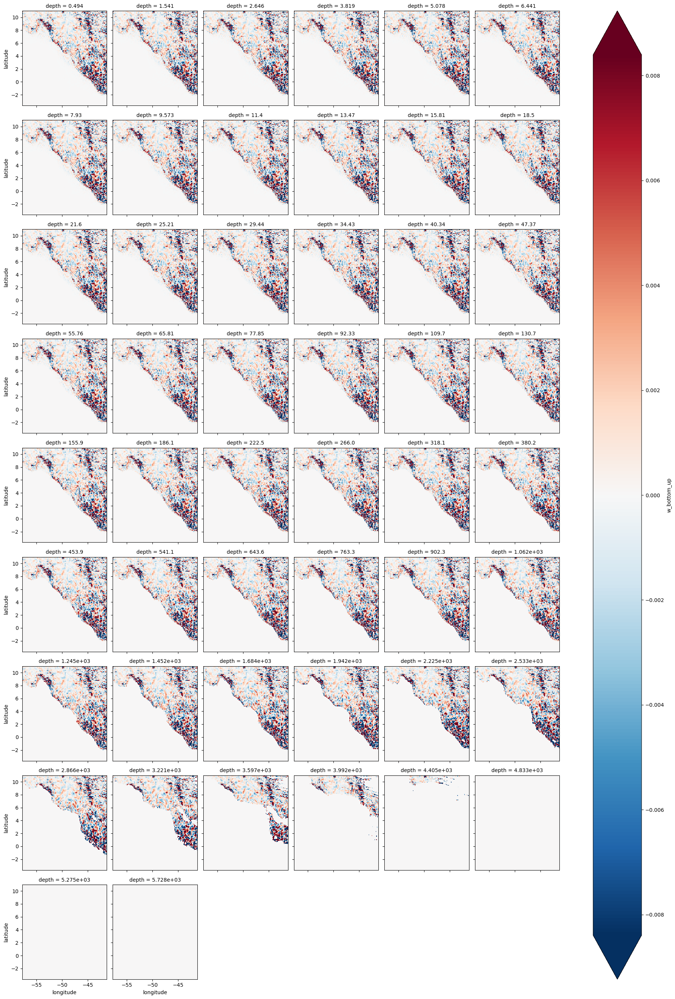

In [30]:
w_bottom_up.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

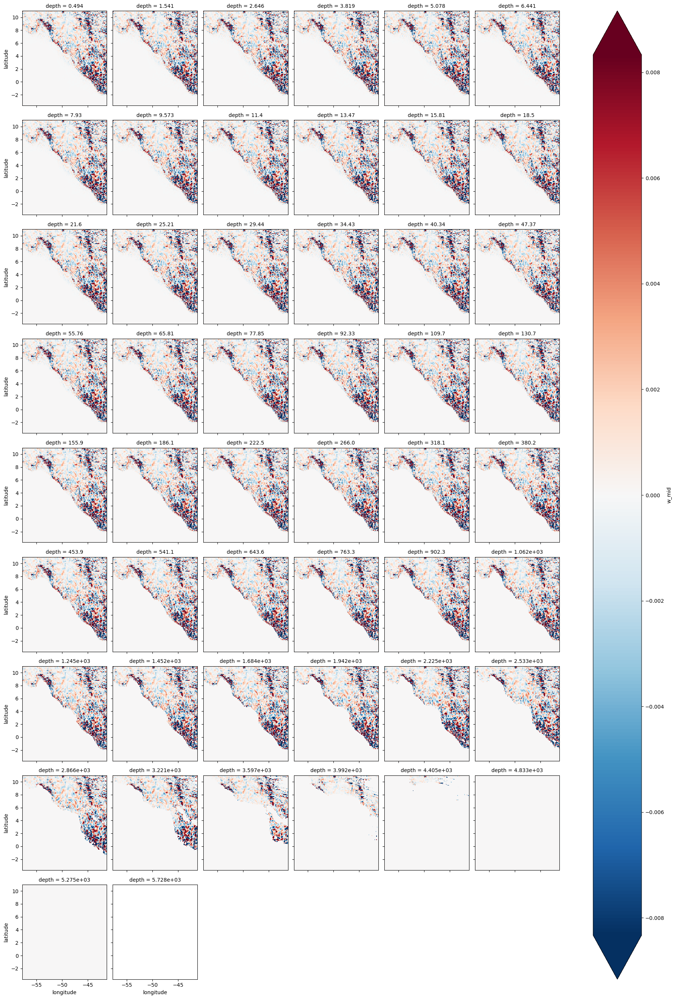

In [35]:
z_mid = (z.shift(depth=-1) + z) / 2
w_mid = 0.5 * (w_bottom_up.shift(depth=-1) + w_bottom_up)
# w_mid = w_mid.isel(depth=slice(0, -1)).assign_coords(depth=z_mid)
w_mid.name = "w_mid"
w_mid.plot(x='longitude',y='latitude',col='depth',col_wrap=6, robust=True)

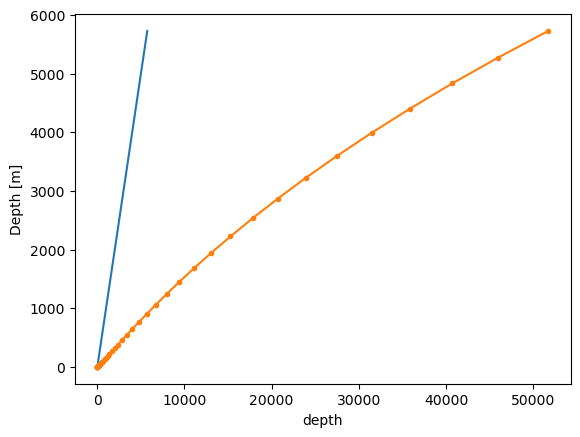

In [52]:
z.plot(y='depth')
z.cumsum().plot(y='depth',marker='.')

df = pd.DataFrame({
    "z [m]": z.depth.data,
    "z_cum [m]": z.cumsum().data,
    "z_cum/z": z.cumsum().data/z.depth.data,
    "z/z_cum": z.depth.data/z.cumsum().data
})


In [53]:
df

,z [m],z_cum [m],z_cum/z,z/z_cum
0,0.494025,0.494025,1.000000,1.000000
1,1.541375,2.035400,1.320509,0.757284
2,2.645669,4.681069,1.769333,0.565185
3,3.819495,8.500564,2.225573,0.449323
4,5.078224,13.578788,2.673924,0.373982
5,6.440614,20.019402,3.108306,0.321719
6,7.929560,27.948961,3.524655,0.283716
7,9.572997,37.521957,3.919562,0.255131
8,11.405000,48.926956,4.289957,0.233103
9,13.467140,62.394096,4.633062,0.215840
